# Objective

We are going to work with the galaxy NGC 6118, a spiral galaxy located 83 million light-years away in the constellation of Serpens. The main objective is to identify the H II regions of the galaxy to obtain information such as its morphology and star-forming regions. To achieve this, we will work with files in the '.fits' format. Before analyzing the galaxy's data, we will process both bias and flats (using two filters: H$\alpha$ and R). For the galaxy data, among other processes, we will clean the background light and cosmic rays, as well as correct defective pixels in the CCD.

# Libraries

We start by importing the Python libraries needed to work with the images; [glob](https://docs.python.org/3/library/glob.html) is used to search for files in a directory, [numpy](https://numpy.org/doc/2.2/user/index.html#user) allows performing numerical calculations, [matplotlib](https://matplotlib.org/stable/users/index.html) is used to [plot graphs](https://matplotlib.org/stable/gallery/), [lacosmic](https://lacosmic.readthedocs.io/en/stable/) is used to remove cosmic rays from astronomical images, [astropy](https://docs.astropy.org/en/stable/index_user_docs.html) has different modules to work with astronomical images, [photutils](https://photutils.readthedocs.io/en/stable/user_guide/index.html) allows the detection and analysis of sources in astronomical images and [scipy.ndimage](https://docs.scipy.org/doc/scipy/reference/ndimage.html) which is used to perform geometric transformations.

In [1]:
import glob
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from lacosmic import lacosmic


from astropy.stats import sigma_clipped_stats, SigmaClip
from photutils.segmentation import detect_threshold, detect_sources
from photutils.utils import circular_footprint


from photutils.detection import DAOStarFinder
from photutils.aperture import CircularAperture, aperture_photometry
from photutils.aperture.stats import ApertureStats


from scipy.ndimage import rotate, zoom

# Data Extraction

We start by storing the names of the '.fits' files we are going to work with in a list. We work with files that start with 'r326' and end with '.fits'. This must be taken into account when saving an image in the same directory; its name should not have these characteristics to prevent unwanted files from being included in the list.

Based on the headers, we store the files in a list containing three sublists: one associated with the 'Galaxy', another with the 'Bias' and the last one with the 'Flats'. We use [list comprehension](https://docs.python.org/3/tutorial/datastructures.html#tut-listcomps), although we could choose another option to avoid some 'for' loops. However, this approach is acceptable since the loops do not iterate over many elements. And in this way, we reduce the number of lines of code written.

In [2]:
fileList = sorted(glob.glob('r326*.fits'))

In [3]:
galaxyList = [
   fileName for fileName in fileList 
   if fits.open(fileName)[0].header['OBJECT'][:7]=='cig0736'
]

biasList = [
   fileName for fileName in fileList
   if fits.open(fileName)[0].header['OBJECT']=='Bias'
]

flatsList = [
   fileName for fileName in fileList
   if fits.open(fileName)[0].header['OBJECT']!='Bias' 
      and fits.open(fileName)[0].header['OBJECT'][:7]!='cig0736'
]

totalList = []
totalList.append(galaxyList)
totalList.append(biasList)
totalList.append(flatsList)

# Imstats function

Next, we define the function that allows us to obtain statistical information from the input data. The returned values include the minimum, maximum, mean, median, standard deviation and number of pixels. Note that we used [np.nanmin( )](https://numpy.org/doc/stable/reference/generated/numpy.nanmin.html), [np.nanmax( )](https://numpy.org/doc/stable/reference/generated/numpy.nanmax.html), [np.nanmean( )](https://numpy.org/doc/stable/reference/generated/numpy.nanmean.html), [np.nanmedian( )](https://numpy.org/doc/stable/reference/generated/numpy.nanmedian.html) and [np.nanstd( )](https://numpy.org/doc/stable/reference/generated/numpy.nanstd.html) to ignore NaN values in the calculations. As we can observe below, since we don’t need to store the variables, we can return the calculated values directly.

In [4]:
def imstats(data):
    """
    Calculates various statistics: minimum, maximum, mean, median, total count, and
    standard deviation of the input pixel data.

    Parameters
    ----------
    data: list or numpy array
        Array of data from which to obtain the statistics. 
         
    Returns
    -------
    dict
        Dictionary with the following keys:
        - 'minimum_stat': Minimum value in data.
        - 'maximum_stat': Maximum value in data.
        - 'mean_stat': Mean value of data.
        - 'median_stat': Median value of data.
        - 'n_pixels': Total number of pixels.
        - 'standard_deviation': Standard deviation of data
    """

    return { 
        'minimum_stat': np.nanmin(data),
        'maximum_stat': np.nanmax(data),
        'mean_stat': np.nanmean(data),
        'median_stat': np.nanmedian(data),
        'n_pixels': np.shape(data)[0]*np.shape(data)[1],
        'standard_deviation': np.nanstd(data)
    }

# Bias

Now we will work with the Bias, which provides information about the noise introduced by the sensor in the CCD. Experimentally, working with the Bias involves using electric fields caused by potential changes and a photon counter. As will be seen later, the images obtained from both the Flats and the Galaxy must be corrected using the Bias. Before working with the Bias list.

As can be seen below,  there are two bias files in which the statistics differ from the rest. We can see that the maximum value and the standard deviation of the files 'r326214.fits' and 'r326285.fits' differ significantly from the others.

In [5]:
print(
    "Order: file, minimum, maximum, mean, median, number of pixels, "
    "standard deviation."
)
for fileName in biasList:
    hdul = fits.open(fileName)
    hdul_data = hdul[0].data
    bias_stat = imstats(hdul_data)
    print(
        fileName,
        bias_stat['minimum_stat'],
        bias_stat['maximum_stat'],
        f"{bias_stat['mean_stat']:.2f}",
        f"{bias_stat['median_stat']:.2f}",
        bias_stat['n_pixels'],
        f"{bias_stat['standard_deviation']:.2f}"
    )

Order: file, minimum, maximum, mean, median, number of pixels, standard deviation.
r326214.fits 514 3862 541.03 541.00 4426560 5.29
r326215.fits 514 65535 541.24 541.00 4426560 31.21
r326216.fits 508 65535 541.27 541.00 4426560 31.37
r326217.fits 509 65535 541.27 541.00 4426560 31.14
r326218.fits 514 65535 542.29 542.00 4426560 31.15
r326285.fits 508 2414 538.28 538.00 4426560 3.84
r326286.fits 511 65535 538.19 538.00 4426560 31.15
r326287.fits 509 65535 538.24 538.00 4426560 31.08
r326288.fits 507 65535 538.34 538.00 4426560 31.21
r326289.fits 508 65535 538.34 538.00 4426560 31.45
r326290.fits 510 65535 538.31 538.00 4426560 31.37
r326291.fits 504 65535 538.31 538.00 4426560 31.32
r326292.fits 511 65535 538.35 538.00 4426560 31.14
r326293.fits 512 65535 538.92 539.00 4426560 31.07
r326294.fits 510 65535 539.01 539.00 4426560 31.45


We proceed to remove the detected files from the Bias list. Below, we can see the view of the Bias files before removing the ones with anomalous statistics.

In [6]:
biasList

['r326214.fits',
 'r326215.fits',
 'r326216.fits',
 'r326217.fits',
 'r326218.fits',
 'r326285.fits',
 'r326286.fits',
 'r326287.fits',
 'r326288.fits',
 'r326289.fits',
 'r326290.fits',
 'r326291.fits',
 'r326292.fits',
 'r326293.fits',
 'r326294.fits']

In [7]:
for badBias in ["r326214.fits", "r326285.fits"]:
    biasList.remove(badBias)

Here, we show the Bias list again to verify that the erroneous files are no longer in the list.

In [8]:
biasList

['r326215.fits',
 'r326216.fits',
 'r326217.fits',
 'r326218.fits',
 'r326286.fits',
 'r326287.fits',
 'r326288.fits',
 'r326289.fits',
 'r326290.fits',
 'r326291.fits',
 'r326292.fits',
 'r326293.fits',
 'r326294.fits']

## Super Bias

After removing the defective Bias files, we stack the remaining Bias images on top of each other and compute the median at each pixel position. This results in a single Bias image, which we call the Super Bias. This image will be the one we use to correct both the flats and the galaxy image. Notice that, as we did in the function we created, imstats( ), we use np.nanmedian( ) to avoid potential issues with NaN values. This will be incorporated throughout the rest of the program for the calculation of Super Flats and the final image of the Galaxy (Super Galaxy) in each filter, as we will see later, to prevent this issue.

In [9]:
bias_concat = [fits.open(bias)[0].data for bias in biasList]
superBias = np.nanmedian(bias_concat, axis=0)

## Super Bias image saving

We save the final image, the Super Bias image.

In [10]:
hduImg = fits.PrimaryHDU(superBias.astype(np.float32))
hduImg.writeto("NGC6118_repo/superBias.fits", overwrite=True)

## Super Bias's statistics

Now, using the function created, imstats( ), we calculate the statistics of the Super Bias image, so that we can use it in the image visualization.

In [10]:
superBias_stat = imstats(superBias)

##  Super Bias visualization

For the visualization of the Super Bias image, we use its own statistics. To generate the visualization, we use the [imshow( )](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html) function. To ensure optimal visualization, we set the minimum value as the median of the Super Bias minus the standard deviation multiplied by a factor. Similarly, the maximum value is taken as the median plus the standard deviation multiplied by the same factor. The factor improves the image visualization, and also allows us the option to view certain details of the image more clearly.

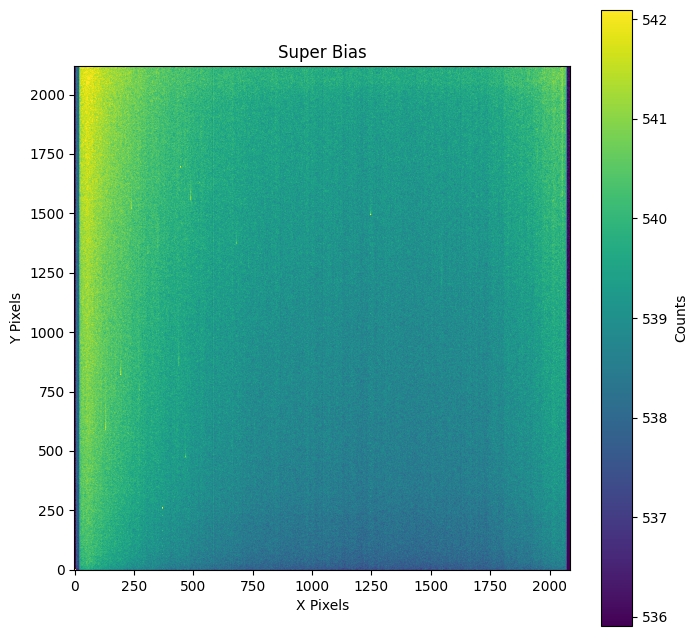

In [11]:
factor = 0.1
plt.figure("Super Bias", figsize=(8, 8))

plt.imshow(
    superBias,
    vmin = superBias_stat['median_stat'] - factor * superBias_stat['standard_deviation'],
    vmax = superBias_stat['median_stat'] + factor * superBias_stat['standard_deviation'], 
    origin="lower"
)

plt.title("Super Bias") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels") 

plt.colorbar(label="Counts")
plt.show()

# Flats

Next, we work with the flats that allow us to correct the variations in the CCD that can cause distortions in the final astronomical images. We are going to work with two Flats, each associated with its own type of flats: the H$\alpha$ (Ha) filter and the R (R) filter. 

The main difference between the H$\alpha$ filter and the R filter is that the former is much more specific, while the R filter allows a broader range of wavelengths. This difference will be crucial, as we will see later, to obtain the final image of the galaxy we are looking for. Additionally, another difference between the filters is their shape. The H$\alpha$ filter is square-shaped, while the R filter is circular. 

Finally, it is worth mentioning that usually an odd number of flats is taken so that the median is a real value, meaning a value from the data we have.

## Flats Ha

In this section, we work with the Ha filter, for which we create a list that contains only the images from this filter. To do this, we work with the header, ensuring that the chosen filter is the correct one.

In [12]:
flatsListHa = [
    fileName for fileName in flatsList
    if fits.open(fileName)[0].header['OBJECT']!='FlatrS' 
        and fits.open(fileName)[0].header['OBJECT']!='FlatAmarS'
]

### Bias correction

As we mentioned earlier, we subtract the Super Bias obtained from each of the flats. Since it is an image of constant noise that affects all the images and that we want to correct.

In [13]:
flatsHa_concat = [fits.open(flatsHa)[0].data for flatsHa in flatsListHa]

flatsHa_concat_corr = [data - superBias for data in flatsHa_concat]

### Flats Ha normalization

Since the flats have different exposure times depending on the intensity of the source, we normalize each of them. Note that, to avoid edge effects from the filters, the median of the central region of the flat field image is used.

In [14]:
# The median of the central region of each of the flats is obtained.
edge = 300
medians_flatsHa_concat_corr = [
    np.median(data[edge:-edge, edge:-edge])
    for data in flatsHa_concat
]

# It is converted with np.array() to work with it more efficiently.
flatsHa_concat_corr=np.array(flatsHa_concat_corr)

# Each of the flats is normalized using the median of the central region.
flatsHa_concat_norm = [
    data1 / data2
    for data1, data2 in zip(flatsHa_concat_corr, medians_flatsHa_concat_corr)
]

### Super Flats Ha

In a similar way to how we did with the Bias and Super Bias, we obtain the Super Flats from all the already corrected flats. Therefore, we stack all the flats and take the median of each pixel.

In [15]:
superFlatsHa = np.nanmedian(flatsHa_concat_norm, axis=0)

### Super Flats Ha image saving

Next, we save the obtained Super Flats H$\alpha$ image in a .fits file

In [13]:
hduImg = fits.PrimaryHDU(superFlatsHa.astype(np.float32))
hduImg.writeto("NGC6118_repo/superFlatsHa.fits", overwrite=True)

### Superflats Ha's statistics

Now, using the function created, imstats( ), we calculate the statistics of the Super Flats image, so that we can use it in the image visualization.

In [16]:
superFlatsHa_norm_stat = imstats(superFlatsHa)

### Flats Ha visualization

In a similar way to how it was done with the Super Bias. For the visualization of the Super Flats image, we use its own statistics. To ensure optimal visualization, we set the minimum value as the median of the Super Flats minus the standard deviation multiplied by a factor. Similarly, the maximum value is taken as the median plus the standard deviation multiplied by the same factor. Here we can observe the square shape of the Ha filter.

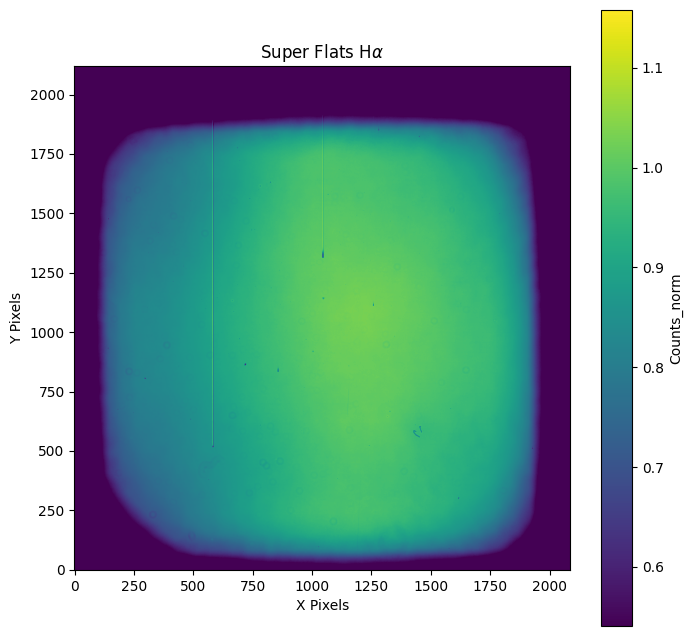

In [17]:
factor = 1
plt.figure(r"Super Flats H$\alpha$", figsize=(8, 8))

plt.imshow(
    superFlatsHa,
    vmin=superFlatsHa_norm_stat['median_stat'] - 
        factor * superFlatsHa_norm_stat['standard_deviation'], 
    vmax=superFlatsHa_norm_stat['median_stat'] + 
        factor * superFlatsHa_norm_stat['standard_deviation'],
   origin="lower"
)

plt.title(r"Super Flats H$\alpha$") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts_norm")
plt.show()

## Flats R

Next, we work with the Flats R in the same way we worked with the Flats H$\alpha$. We work with the R filter, for which we create a list that contains only the images associated with this filter. To do this, we work with the header, ensuring that the chosen flat is the correct one.

In [18]:
flatsListR = [
    fileName for fileName in flatsList 
    if fits.open(fileName)[0].header['OBJECT']=='FlatrS' 
        or fits.open(fileName)[0].header['OBJECT']=='FlatAmarS'
]

### Bias correction

We subtract the Super Bias obtained from each of the flats. Since it is an image of constant noise that affects all the images and that we want to correct.

In [19]:
flatsR_concat = [fits.open(flatsR)[0].data for flatsR in flatsListR]

flatsR_concat_corr = [data - superBias for data in flatsR_concat]

### Flats R normalization

Since the flats have different exposure times depending on the intensity of the source, we normalize each of them. Note that, to avoid edge effects from the filters, the median of the central region of the flat field image is used.

In [20]:
# The median of the central region of each of the flats is obtained.
edge = 300
medians_flatsR_concat_corr = [
    np.median(data[edge:-edge, edge:-edge]) 
    for data in flatsR_concat
]

# It is converted with np.array() to work with it more efficiently.
flatsR_concat_corr = np.array(flatsR_concat_corr)

# Each of the flats is normalized using the median of the central region.
flatsR_concat_norm = [
    data1 / data2
    for data1, data2 in zip(flatsR_concat_corr, medians_flatsR_concat_corr)
]

### Super Flats R

In a similar way to how we did with the Bias and Super Bias, we obtain the Super Flats R from all the already corrected flats. Therefore, we stack all the flats and take the median of each pixel.

In [21]:
# To optimize the calculation of the median.
flatsR_concat_norm = np.array(flatsR_concat_norm)

In [22]:
superFlatsR = np.nanmedian(flatsR_concat_norm, axis=0)

### Super Flats R image saving

Next, we save the obtained Super Flats R image in a .fits file

In [19]:
hduImg = fits.PrimaryHDU(superFlatsR.astype(np.float32))
hduImg.writeto("/NGC6118_repo/superFlatsR.fits", overwrite=True)

### Superflats R's statistics

Now, using the function created, imstats( ), we calculate the statistics of the Super Flats image, so that we can use it in the image visualization.

In [23]:
superFlatsR_stat = imstats(superFlatsR)

### Flats R visualization

In a similar way to how it was done with the Super Bias. For the visualization of the Super Flats image, we use its own statistics. To ensure optimal visualization, we set the minimum value as the median of the Super Flats minus the standard deviation multiplied by a factor. Similarly, the maximum value is taken as the median plus the standard deviation multiplied by the same factor. Here we can observe the circular shape of the R filter.

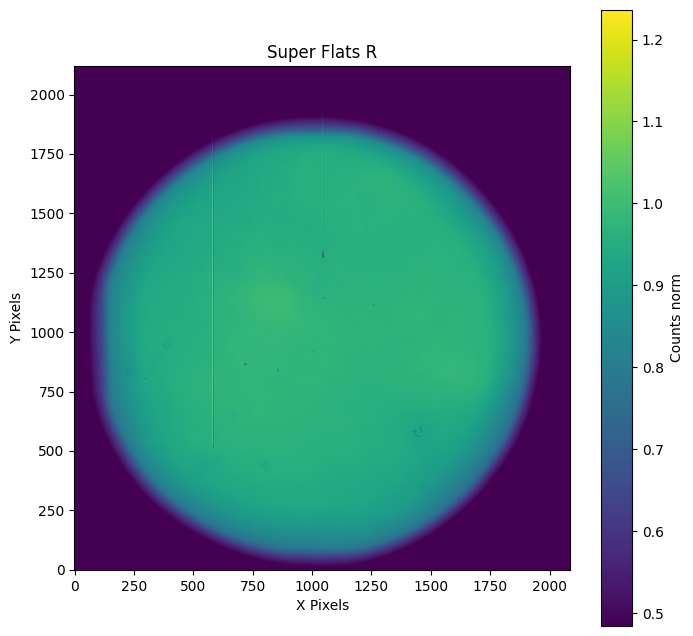

In [24]:
factor = 1
plt.figure("Super Flats R", figsize=(8, 8))

plt.imshow(
    superFlatsR,
    vmin=superFlatsR_stat['median_stat'] - factor * superFlatsR_stat['standard_deviation'],
    vmax=superFlatsR_stat['median_stat'] + factor * superFlatsR_stat['standard_deviation'],
    origin="lower"
)

plt.title("Super Flats R") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

# Galaxy

Now, we will work with the galaxy images. We will divide the study into two subsections to make it clear: one associated with the Ha filter, which we will call "Galaxy Ha", and the other corresponding to the R filter, "Galaxy R". 

In each of the subsections, the appropriate data processing will be carried out in a similar way to achieve the proposed objective. This processing consists of several steps, which will be detailed in the subsections.

Next, we will proceed to collect the different images associated with either the Ha filter or the R filter, with four images for each filter. We should note that, although in this case, the exposure times are the same for all four images, there could be situations where the exposure time changes.

In [26]:
galaxyRList = [
    fileName for fileName in galaxyList
    if fits.open(fileName)[0].header['OBJECT'][:8]=='cig0736r'
]

galaxyHaList = [
    fileName for fileName in galaxyList
    if fits.open(fileName)[0].header['OBJECT'][:9]=='cig0736Ha'
]

exptimeR = [fits.open(fileName)[0].header['EXPTIME'] for fileName in galaxyRList]
exptimeHa = [fits.open(fileName)[0].header['EXPTIME'] for fileName in galaxyHaList]

It is not necessary to start working with the entire code from the beginning. If we have already calculated the Super Flats and saved the .fits files, we can work with them directly. That is what is done next: the data of the Super Flats associated with each filter are assigned to the variables superFlatsHa and superFlatsR.

In [35]:
superFlatsHa = fits.open("NGC6118_repo/superFlatsHa.fits")
superFlatsR = fits.open("NGC6118_repo/superFlatsR.fits")
superBias = fits.open("NGC6118_repo/superBias.fits")

## Galaxy Ha

We open the .fits files associated with Ha, to extract the data and store it in a list.

In [27]:
galaxyHa_concat = [
    fits.open(galaxyHa)[0].data.astype(np.float32)
    for galaxyHa in galaxyHaList
]

In [28]:
galaxyHa0_concat_stat = imstats(galaxyHa_concat[0])

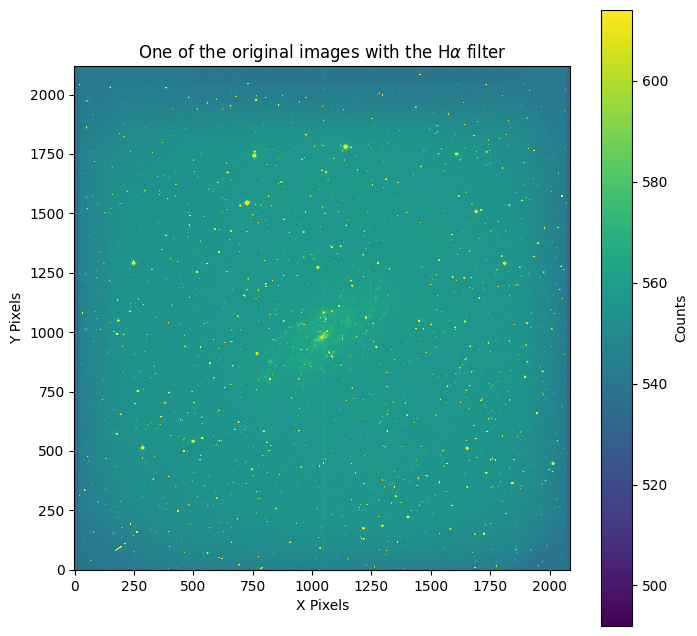

In [57]:
factor = 0.7
plt.figure(r"One of the original images with the $H_\alpha$ filter", figsize=(8, 8))

plt.imshow(
    galaxyHa_concat[0],
    vmin=galaxyHa0_concat_stat['median_stat'] - factor * galaxyHa0_concat_stat['standard_deviation'],
    vmax=galaxyHa0_concat_stat['median_stat'] + factor * galaxyHa0_concat_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"One of the original images with the H$\alpha$ filter") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")   

plt.colorbar(label="Counts")
plt.show()

### Cosmic rays

In this section, we clean the cosmic rays from the image. Cosmic rays are generally protons coming from the Sun, accelerated by magnetic fields, which collide with the CCD. For this, as we had already mentioned, we use [lacosmic](https://lacosmic.readthedocs.io/en/stable/).

In [30]:
galaxyHa_clean = []
masksHa = []

for data, fileName in zip(galaxyHa_concat, galaxyHaList):
    print(f"For the file:", fileName)
    image_cle, mask_lac = lacosmic(
        data,
        contrast=2, cr_threshold=20, neighbor_threshold=10,
        effective_gain=10, readnoise=0
    )
    galaxyHa_clean.append(image_cle)
    masksHa.append(mask_lac)

For the file: r326249.fits
INFO: Iteration 1: Found 2554 cosmic-ray pixels, Total: 2554 [lacosmic.core]
INFO: Iteration 2: Found 146 cosmic-ray pixels, Total: 2700 [lacosmic.core]
INFO: Iteration 3: Found 4 cosmic-ray pixels, Total: 2704 [lacosmic.core]
INFO: Iteration 4: Found 0 cosmic-ray pixels, Total: 2704 [lacosmic.core]
For the file: r326250.fits
INFO: Iteration 1: Found 2659 cosmic-ray pixels, Total: 2659 [lacosmic.core]
INFO: Iteration 2: Found 110 cosmic-ray pixels, Total: 2769 [lacosmic.core]
INFO: Iteration 3: Found 4 cosmic-ray pixels, Total: 2773 [lacosmic.core]
INFO: Iteration 4: Found 0 cosmic-ray pixels, Total: 2773 [lacosmic.core]
For the file: r326251.fits
INFO: Iteration 1: Found 2753 cosmic-ray pixels, Total: 2753 [lacosmic.core]
INFO: Iteration 2: Found 118 cosmic-ray pixels, Total: 2871 [lacosmic.core]
INFO: Iteration 3: Found 3 cosmic-ray pixels, Total: 2874 [lacosmic.core]
INFO: Iteration 4: Found 0 cosmic-ray pixels, Total: 2874 [lacosmic.core]
For the file: r3

We have separated the mask on one side and the cosmic ray corrected data on the other side.

#### Saving the Galaxy Ha images without cosmic rays and the masks.

In [25]:
# The galaxy data is saved after being processed with lacosmic.
for i, data in enumerate(galaxyHa_concat_clean):
    hduImg = fits.PrimaryHDU(data.astype(np.float32))
    hduImg.writeto(f"NGC6118_repo/cigHacleanlac_{i}.fits", overwrite=True)

In [17]:
# The mask obtained in the process of removing cosmic rays using lacosmic is saved.
for i, data in enumerate(masksHa):
    hduImg = fits.PrimaryHDU(data.astype(np.float32))
    hduImg.writeto(f"NGC6118_repo/maskHa_lac{i}.fits", overwrite=True)

#### Visualization of the image with cosmic rays, without cosmic rays, and the mask.

Here, we will visualize the original image and the cleaned image of the galaxy. That is, the image with cosmic rays and the image without cosmic rays. Additionally, we display the mask that highlights all the cosmic rays that have been removed. Each of the representations will be made for only one of the four galaxy images we have.

In [31]:
galaxyHa0_concat_stat = imstats(galaxyHa_concat[0])
galaxyHa0_clean_stat = imstats(galaxyHa_clean[0])

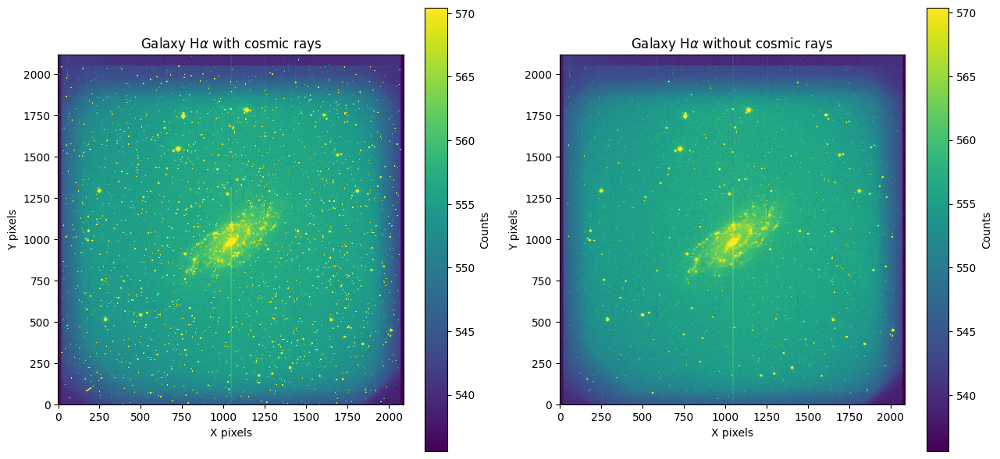

In [58]:
factor1 = 0.2
factor2 = 0.5

fig, axes = plt.subplots(1, 2, figsize=(13, 6))

axes[0].imshow(
    galaxyHa_concat[0],
    vmin=galaxyHa0_concat_stat['median_stat'] - factor1 * galaxyHa0_concat_stat['standard_deviation'],
    vmax=galaxyHa0_concat_stat['median_stat'] + factor1 * galaxyHa0_concat_stat['standard_deviation'],
    origin="lower"
)
axes[0].set_title(r"Galaxy H$\alpha$ with cosmic rays")
axes[0].set_xlabel("X pixels")
axes[0].set_ylabel("Y pixels")
fig.colorbar(axes[0].images[0], ax=axes[0], label="Counts")

axes[1].imshow(
    galaxyHa_clean[0], 
    vmin=galaxyHa0_clean_stat['median_stat'] - factor2 * galaxyHa0_clean_stat['standard_deviation'],
    vmax=galaxyHa0_clean_stat['median_stat'] + factor2 * galaxyHa0_clean_stat['standard_deviation'],
    origin="lower"
)
axes[1].set_title(r"Galaxy H$\alpha$ without cosmic rays")
axes[1].set_xlabel("X pixels")
axes[1].set_ylabel("Y pixels")
fig.colorbar(axes[1].images[0], ax=axes[1], label="Counts") 

plt.tight_layout()  
plt.show()

In [33]:
masksHa0_stat = imstats(masksHa[0])

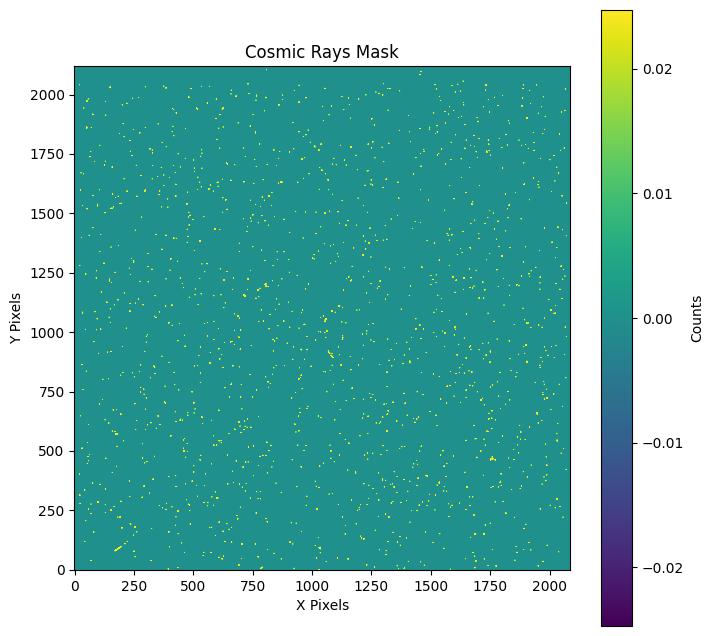

In [59]:
factor = 1
plt.figure("Cosmic rays mask", figsize=(8, 8))

plt.imshow(
    masksHa[0],
    vmin=masksHa0_stat['median_stat'] - factor * masksHa0_stat['standard_deviation'],
    vmax=masksHa0_stat['median_stat'] + factor * masksHa0_stat['standard_deviation'],
    origin="lower"
)

plt.title("Cosmic Rays Mask") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")   

plt.colorbar(label="Counts")
plt.show()

### Bias correction

Similarly to what we did earlier with the Flats, we subtract the Super Bias obtained from each of the galaxy images. Since the Super Bias is a background noise for all the obtained images.

In [35]:
galaxyHa_corr = [data - superBias for data in galaxyHa_clean]
galaxyHa_corr = np.array(galaxyHa_corr)
superFlatsHa = np.array(superFlatsHa)

### Super Flats division

We normalize each of the galaxy images by dividing by the Super Flats of the corresponding filter, that is, H$\alpha$ in this case.

In [36]:
galaxyHa_norm = [
    data / superFlatsHa
    for data in galaxyHa_corr
]

galaxyHa_norm = np.nan_to_num(galaxyHa_norm, nan=0)

C:\Users\Juan Jiménez Luque\AppData\Local\Temp\ipykernel_3600\1022976116.py:2: RuntimeWarning: divide by zero encountered in divide
  data / superFlatsHa
C:\Users\Juan Jiménez Luque\AppData\Local\Temp\ipykernel_3600\1022976116.py:2: RuntimeWarning: invalid value encountered in divide
  data / superFlatsHa


We define a variable in which we store the central region of the galaxy for each of the images.

In [37]:
edge = 300
galaxyHa_norm_redu = [
    data[edge:-edge, edge:-edge] 
    for data in galaxyHa_norm
]

In [38]:
galaxyHa_norm_redu_stat = imstats(galaxyHa_norm_redu)

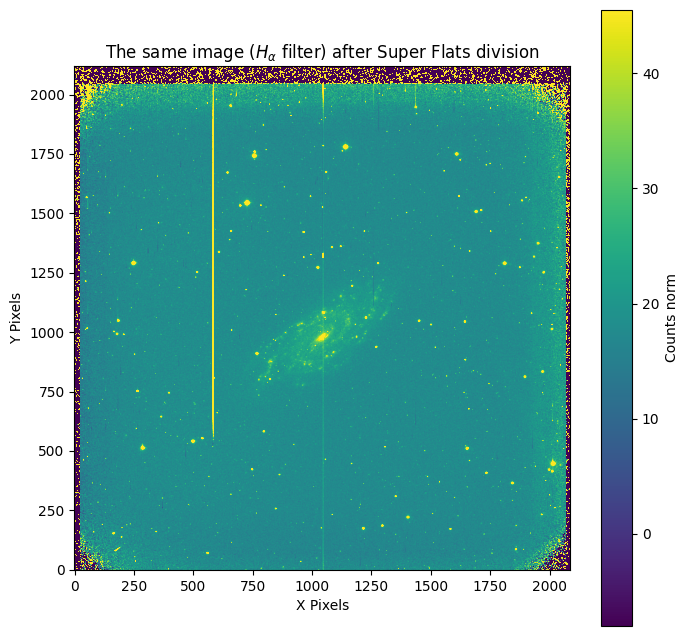

In [39]:
factor = 0.6
plt.figure("After Super Flats divisions Ha", figsize=(8, 8))

plt.imshow(
    galaxyHa_norm[0],
    vmin=galaxyHa_norm_redu_stat['median_stat'] - factor * galaxyHa_norm_redu_stat['standard_deviation'],
    vmax=galaxyHa_norm_redu_stat['median_stat'] + factor * galaxyHa_norm_redu_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"The same image ($H_\alpha$ filter) after Super Flats division") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

### Background light

In this step, we are going to remove the background light, which is noise throughout the image. The main source of this noise is the light from the moon, that is, sunlight reflected off the moon. For this, we work with [Photutils](https://photutils.readthedocs.io/en/stable/user_guide/background.html), specifically with Masking Sources

In [40]:
galaxyHa_noLight = []

In [41]:
sigma_clip_lac = SigmaClip(sigma=3.0, maxiters=10)

threshold = [
    detect_threshold(data, nsigma=2.0, sigma_clip=sigma_clip_lac)
    for data in galaxyHa_norm_redu
]

In [42]:
segment_img = [
    detect_sources(data1, data2, npixels=10) 
    for data1, data2 in zip(galaxyHa_norm_redu, threshold)
]

In [43]:
footprint_lac = circular_footprint(radius=10)
mask_list = [
    data.make_source_mask(footprint=footprint_lac) 
    for data in segment_img
]

In [44]:
stats_list = [
    sigma_clipped_stats(data1, sigma=3.0, mask=data2)
    for data1, data2 in zip(galaxyHa_norm_redu, mask_list)
]

We subtract the obtained median from all the pixels of the image we had obtained, each median with its corresponding image. Observe that we are subtracting data2[1], where data2 is an element of stats_list, which contains the obtained statistics. By checking the function's documentation, we see that at position [1], it returns the median, which is what we are interested in.

In [45]:
for data1, data2 in zip(galaxyHa_norm, stats_list):
    galaxyHa_noLight.append(data1 - data2[1])

In [30]:
# The galaxy data is saved after the background light is removed.
for i, data in enumerate(galaxyHa_concat_corr):
    hduImg = fits.PrimaryHDU(data.astype(np.float32))
    hduImg.writeto(f"NGC6118_repo/cigHa_skycorr_{i}.fits", overwrite=True)

In [49]:
galaxyHa_noLight_stats = imstats(galaxyHa_noLight[0][300:-300, 300:-300])

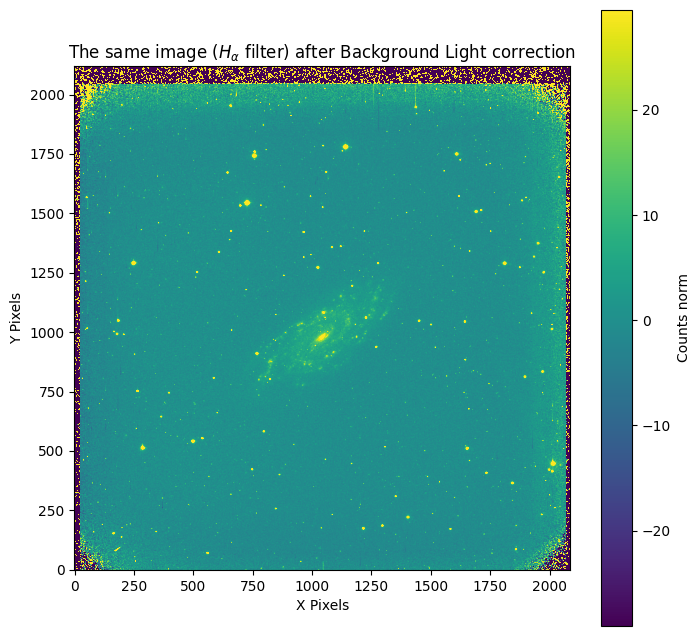

In [50]:
factor = 0.6
plt.figure("Background Light Ha", figsize=(8, 8))

plt.imshow(
    galaxyHa_noLight[0],
    vmin=galaxyHa_noLight_stats['median_stat'] - factor * galaxyHa_noLight_stats['standard_deviation'],
    vmax=galaxyHa_noLight_stats['median_stat'] + factor * galaxyHa_noLight_stats['standard_deviation'],
    origin="lower"
)

plt.title(r"The same image ($H_\alpha$ filter) after Background Light correction") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

### Bad pixel correction

Next, we correct the defective pixels in the image. Clearly anomalous vertical lines are visible, and these lines are caused by collisions on the CCD. To do this, we work with a list that indicates the position of the erroneous pixels.

We use np.loadtxt( ) to open the file containing the defective pixels. We directly save the values into four different variables (arrays), using unpack=True and dtype=int. The coordinates are defined in this way, subtracting one because the program used to detect the lines (ds9) and the data array in Python differ by one pixel. This could be taken into account by adjusting the indices in the calculation (in the following lines of code), but we have chosen to leave it as is to make it explicitly clear as commented.

In [51]:
x_1, x_2, y_1, y_2 = np.loadtxt('badpix.lis', unpack=True, dtype=int)

x_1 = x_1 - 1
x_2 = x_2 - 1
y_1 = y_1 - 1
y_2 = y_2 - 1
    
for j, data in enumerate(galaxyHa_noLight):
    for x1, x2, y1, y2 in zip(x_1, x_2, y_1, y_2):
        x_neighbors = [x1 - 1, x2 + 1]
        
        for k in range(y1, y2 + 1):
            fp = data[k, x_neighbors]

            # Parameters of np.interp(): x are the positions where I want to perform the interpolation; 
            # xp are the reference data positions for interpolation; fp is the value at those positions.
            
            galaxyHa_noLight[j][k, x1:(x2+1)] = np.interp(
                x=np.arange(x1, x2 + 1),
                xp=x_neighbors, 
                fp=fp
            ) 

In [32]:
# The galaxy data is saved after the defective pixels are removed.
for i, data in enumerate(galaxyHa_concat_corr):
    hduImg = fits.PrimaryHDU(data.astype(np.float32))
    hduImg.writeto(f"NGC6118_repo/cigHa_pixcorr_{i}.fits", overwrite=True)

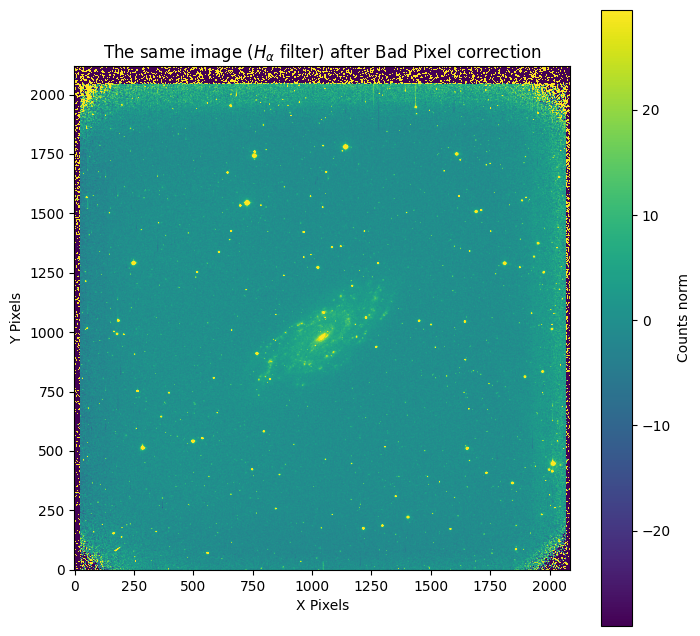

In [52]:
factor = 0.6
plt.figure("Bad Pixel correction Ha", figsize=(8, 8))

plt.imshow(
    galaxyHa_noLight[0],
    vmin=galaxyHa_noLight_stats['median_stat'] - factor * galaxyHa_noLight_stats['standard_deviation'],
    vmax=galaxyHa_noLight_stats['median_stat'] + factor * galaxyHa_noLight_stats['standard_deviation'],
    origin="lower"
)

plt.title(r"The same image ($H_\alpha$ filter) after Bad Pixel correction") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

### Exptime division

We divide each image by its associated exposure time, thus normalizing the data, eliminating the effect of the capture time, and allowing consistent comparisons between different observations, making the results more universal and easily reusable.

In [53]:
galaxyHa_exp = [
    data1 / data2
    for data1, data2 in zip(galaxyHa_noLight, exptimeHa)
]
galaxyHa_exp = np.array(galaxyHa_exp)

In [54]:
galaxyHa_exp_stats = imstats(galaxyHa_exp[0][300:-300, 300:-300])

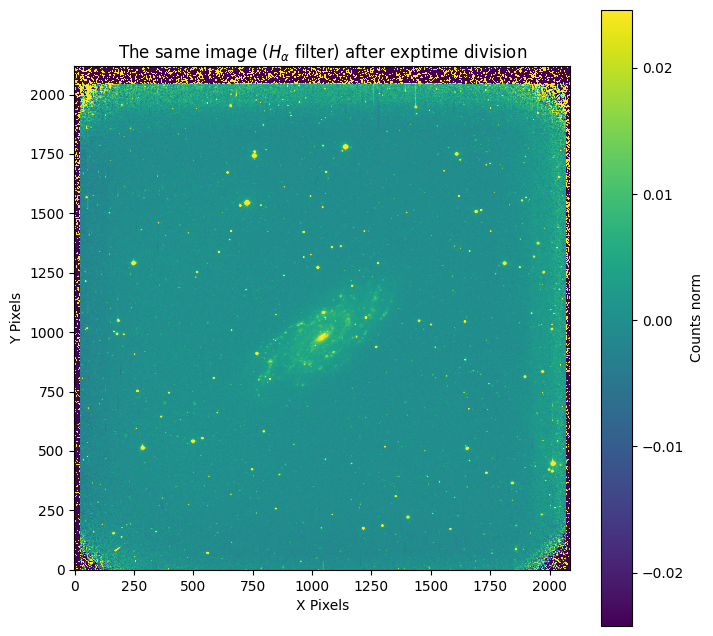

In [56]:
factor = 0.6
plt.figure("Exptime division Ha", figsize=(8, 8))

plt.imshow(
    galaxyHa_exp[0],
    vmin=galaxyHa_exp_stats['median_stat'] - factor * galaxyHa_exp_stats['standard_deviation'],
    vmax=galaxyHa_exp_stats['median_stat'] + factor * galaxyHa_exp_stats['standard_deviation'],
    origin="lower"
)

plt.title(r"The same image ($H_\alpha$ filter) after exptime division") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

### Super Galaxy Ha

In a similar way to how we handled the Bias and Super Bias, and the Flats and Super Flats, we obtain the Super Galaxy Ha from all the already corrected galaxy Ha images. To do this, we stack all the galaxy Ha images and take the median of each pixel.

In [61]:
superGalaxyHa = np.nanmedian(galaxyHa_exp, axis=0)

superGalaxyHa = np.nan_to_num(superGalaxyHa, nan=0)

In [131]:
# The obtained Super Galaxy image is saved.
hduImg = fits.PrimaryHDU(superGalaxyHa.astype(np.float32))
hduImg.writeto(f"/NGC6118_repo/cigsuperHa.fits", overwrite=True)

### Galaxy Ha's statistics

Now, using the function created, imstats( ), we calculate the statistics of the Super Galaxy Ha image, so that we can use it in the image visualization. In this case, we will obtain the statistics from the central area of the image, as this is where the galaxy, the object we want to study, is located. This way, we also avoid the statistics from the edges, which are influenced by the edge effects of the filter.

In [62]:
edge1 = 350
superGalaxyHa_redu = superGalaxyHa[edge1:-edge1, edge1:-edge1]

superGalaxyHa_redu_stat = imstats(superGalaxyHa_redu)

In [63]:
superGalaxyHa_redu_sinan = np.nan_to_num(superGalaxyHa_redu, nan=0)

superGalaxyHa_redu_sinan_stat = imstats(superGalaxyHa_redu_sinan)

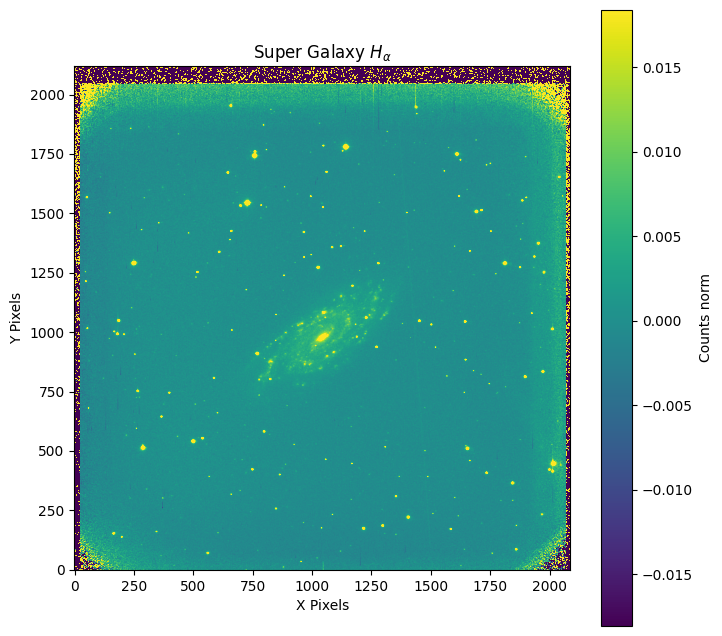

In [64]:
factor = 0.6
plt.figure("Super Galaxy Ha", figsize=(8, 8))

plt.imshow(
    superGalaxyHa,
    vmin=superGalaxyHa_redu_sinan_stat['median_stat'] - factor * superGalaxyHa_redu_sinan_stat['standard_deviation'],
    vmax=superGalaxyHa_redu_sinan_stat['median_stat'] + factor * superGalaxyHa_redu_sinan_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"Super Galaxy $H_\alpha$") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

### DAOStarFinder - Photometry

In this section, we perform the detection of stars using [DAOStarFinder](https://photutils.readthedocs.io/en/stable/user_guide/detection.html). We apply a mask to the center of the galaxy to avoid detecting stars in this region, as we only want to obtain extragalactic stars. DAOStarFinder allows us to find the pixels in the image that have a flux value above a certain threshold, thus locating the positions of the stars.

In [65]:
factor = 3.0
daofind = DAOStarFinder(
    fwhm=2.0,
    threshold=factor * superGalaxyHa_redu_sinan_stat['standard_deviation']
)

In [66]:
# This is used to mask the center of the galaxy, so that stars are not searched in that area.
maskStar = np.zeros(superGalaxyHa_redu_sinan.shape, dtype=bool)
edge2 = 300
maskStar[edge2:-edge2, edge2:-edge2] = True

In [67]:
sources = daofind(
    superGalaxyHa_redu_sinan - superGalaxyHa_redu_sinan_stat['median_stat'],
    mask=maskStar
)

In [68]:
for col in sources.colnames:
    if col not in ('id', 'npix'):
        sources[col].info.format = '%.2f'
sources.pprint(max_width=76)

 id xcentroid ycentroid sharpness ...  peak  flux   mag  daofind_mag
--- --------- --------- --------- ... ----- ------ ----- -----------
  1   1382.97     58.82      0.58 ...  0.51   5.99 -1.94       -1.37
  2    399.06     73.07      0.57 ...  0.30   3.88 -1.47       -0.66
  3   1302.29    161.85      0.61 ...  1.89  20.76 -3.29       -2.82
  4    150.91    191.68      0.57 ...  2.13  28.91 -3.65       -2.72
  5    189.81    204.02      0.61 ...  0.41   5.40 -1.83       -0.94
  6    448.07    232.67      0.59 ...  0.38   4.59 -1.65       -1.00
  7     16.88    295.12      0.56 ...  0.18   2.55 -1.02       -0.04
  8    237.77    457.99      0.56 ...  0.19   2.26 -0.89       -0.24
  9   1294.45    534.72      0.57 ...  0.16   1.85 -0.67       -0.18
 10   1150.37    682.38      0.63 ...  0.24   2.59 -1.03       -0.55
 11   1292.73    694.94      0.53 ...  0.54   6.25 -1.99       -1.52
 12   1100.44    698.33      0.63 ...  0.68   7.19 -2.14       -1.74
 13    167.98    903.13      0.60 

Now we need to adjust the positions, so we add 'edge1' to the obtained result. When applying the mask, we must take this into account when obtaining the star positions.

In [69]:
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))

Now, we use aperture_photometry, which allows us to measure the flux in a given aperture, we define this aperture using CircularAperture.. To do this, we use the positions of the stars that we just obtained.

In [108]:
apertures = CircularAperture(positions, r=10)
out_phot = aperture_photometry(superGalaxyHa_redu_sinan, apertures)
out_phot

id,xcenter,ycenter,aperture_sum
int64,float64,float64,float64
1,1382.9726747114842,58.82467609265136,8.441563179396967
2,399.0625641990356,73.07038018833686,5.951695722805984
3,1302.2871124066728,161.85274132794018,31.18169266130992
4,150.90969215233605,191.68006538356687,46.40676382878878
5,189.8050181960746,204.02158730587064,8.721591892161346
6,448.06741809829845,232.67189616205843,6.997645121224707
7,16.881290231165607,295.1181616345547,4.207812894596804
8,237.76744804925133,457.98950272846366,3.622327593581378
9,1294.452291113696,534.7168451938333,2.679889761339752


In [109]:
fluxHa = np.array(out_phot['aperture_sum'])

### Galaxy (Ha) visualization

Next, we display the image of the galaxy and mark the positions of the stars we have located with a red circle.

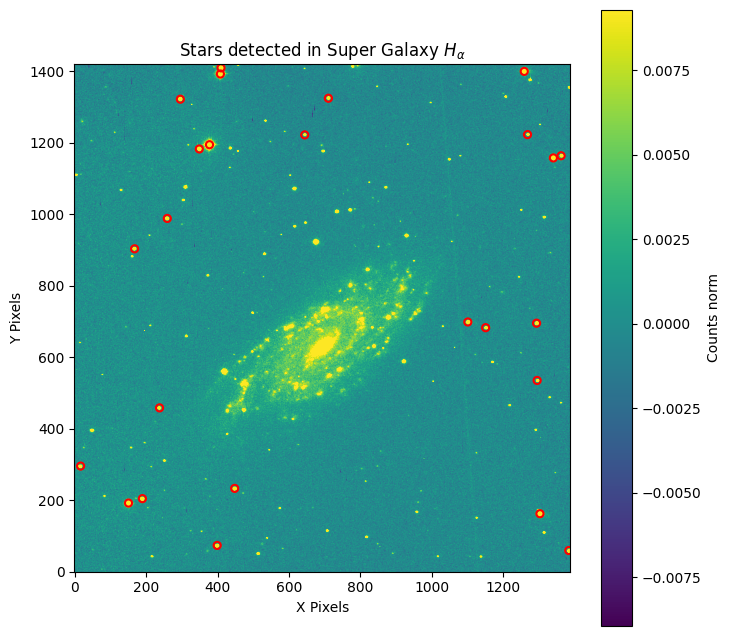

In [134]:
factor = 0.3
plt.figure("Super Galaxy Ha - Stars", figsize=(8, 8))

plt.imshow(
    superGalaxyHa_redu,
    vmin=superGalaxyHa_redu_sinan_stat['median_stat'] -
        factor * superGalaxyHa_redu_sinan_stat['standard_deviation'],
    vmax=superGalaxyHa_redu_sinan_stat['median_stat'] + 
        factor * superGalaxyHa_redu_sinan_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"Stars detected in Super Galaxy $H_\alpha$") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

apertures.plot(color='red', lw=1.5)

plt.colorbar(label="Counts norm")
plt.show()

## Galaxy R

We proceed in an analogous manner to how we processed the images of the galaxy associated with the Hα filter, but now associated with the R filter. We open the .fits files associated with Ha, to extract the data and store it in a list.

In [73]:
galaxyR_concat = [
    fits.open(galaxyR)[0].data.astype(np.float32)
    for galaxyR in galaxyRList
]

In [74]:
galaxyR0_concat_stat = imstats(galaxyR_concat[0])

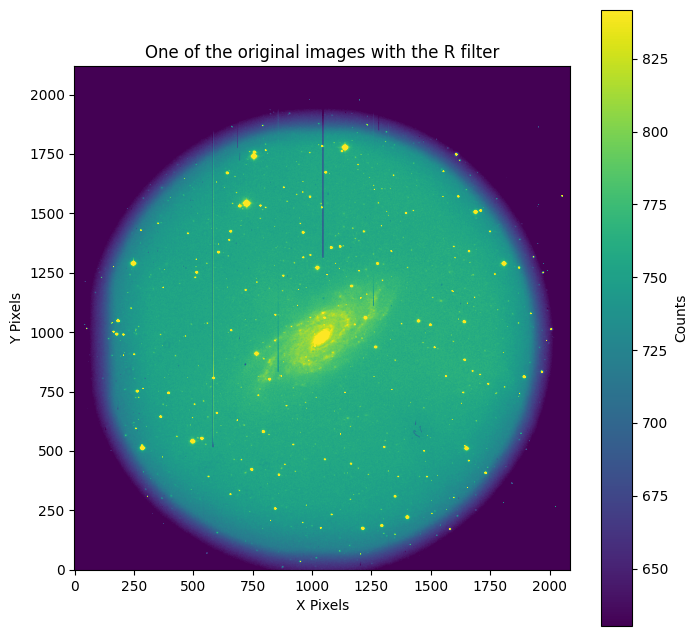

In [79]:
factor = 0.4
plt.figure("One of the original images with the R filter", figsize=(8, 8))

plt.imshow(
    galaxyR_concat[0],
    vmin=galaxyR0_concat_stat['median_stat'] - factor * galaxyR0_concat_stat['standard_deviation'],
    vmax=galaxyR0_concat_stat['median_stat'] + factor * galaxyR0_concat_stat['standard_deviation'],
    origin="lower"
)

plt.title("One of the original images with the R filter") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")   

plt.colorbar(label="Counts")
plt.show()

### Cosmic rays

In this section, we clean the cosmic rays from the image. Cosmic rays are generally protons coming from the Sun, accelerated by magnetic fields, which collide with the CCD. For this, as we had already mentioned, we use [lacosmic](https://lacosmic.readthedocs.io/en/stable/).

In [76]:
galaxyR_clean = []
masksR = []

for data, fileName in zip(galaxyR_concat, galaxyRList):
    print(f"For the file:", fileName)
    image_cle, mask_lac = lacosmic(
        data,
        contrast=2, cr_threshold=20, neighbor_threshold=10,
        effective_gain=10, readnoise=0
    )
    galaxyR_clean.append(image_cle)
    masksR.append(mask_lac)

For the file: r326245.fits
INFO: Iteration 1: Found 793 cosmic-ray pixels, Total: 793 [lacosmic.core]
INFO: Iteration 2: Found 73 cosmic-ray pixels, Total: 866 [lacosmic.core]
INFO: Iteration 3: Found 31 cosmic-ray pixels, Total: 897 [lacosmic.core]
INFO: Iteration 4: Found 29 cosmic-ray pixels, Total: 926 [lacosmic.core]
For the file: r326246.fits
INFO: Iteration 1: Found 809 cosmic-ray pixels, Total: 809 [lacosmic.core]
INFO: Iteration 2: Found 56 cosmic-ray pixels, Total: 865 [lacosmic.core]
INFO: Iteration 3: Found 27 cosmic-ray pixels, Total: 892 [lacosmic.core]
INFO: Iteration 4: Found 18 cosmic-ray pixels, Total: 910 [lacosmic.core]
For the file: r326247.fits
INFO: Iteration 1: Found 749 cosmic-ray pixels, Total: 749 [lacosmic.core]
INFO: Iteration 2: Found 40 cosmic-ray pixels, Total: 789 [lacosmic.core]
INFO: Iteration 3: Found 6 cosmic-ray pixels, Total: 795 [lacosmic.core]
INFO: Iteration 4: Found 6 cosmic-ray pixels, Total: 801 [lacosmic.core]
For the file: r326248.fits
INF

We have separated the mask on one side and the cosmic ray corrected data on the other side.

#### Saving the Galaxy Ha images without cosmic rays and the masks.

In [74]:
# The galaxy data is saved after being processed with lacosmic.
for i, data in enumerate(galaxyR_concat_clean):
    hduImg = fits.PrimaryHDU(galaxyR_concat[i].astype(np.float32))
    hduImg.writeto(f"cigRcleanlac_{i}.fits", overwrite=True)

In [478]:
# The mask obtained in the process of removing cosmic rays using lacosmic is saved.
for i, data in enumerate(masksR):
    hduImg = fits.PrimaryHDU(masksR_concat[i].astype(np.float32))
    hduImg.writeto(f"NGC6118_repo/maskR_{i}.fits", overwrite=True)

#### Visualization of the image with cosmic rays, without cosmic rays, and the mask.

Here, we will visualize the original image and the cleaned image of the galaxy. That is, the image with cosmic rays and the image without cosmic rays. Additionally, we display the mask that highlights all the cosmic rays that have been removed. Each of the representations will be made for only one of the four galaxy images we have.

In [77]:
galaxyR0_concat_stat = imstats(galaxyR_concat[0])
galaxyR0_clean_stat = imstats(galaxyR_clean[0])

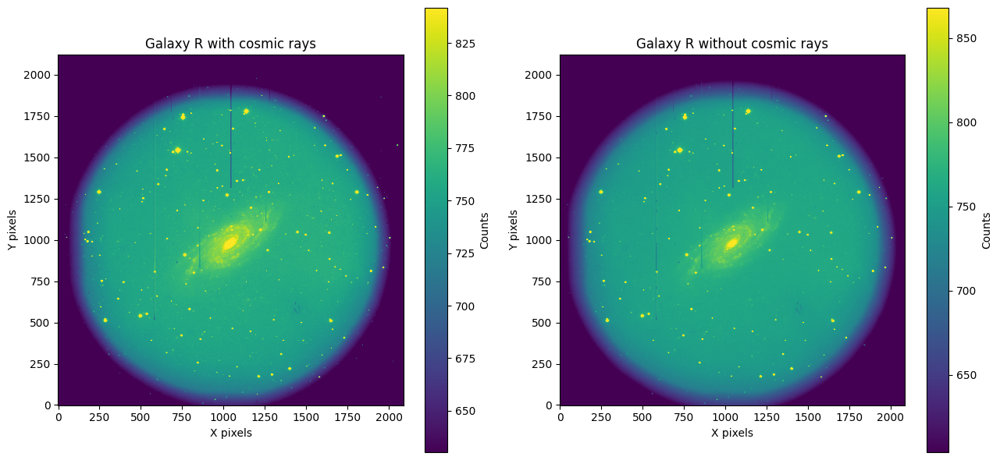

In [80]:
factor1 = 0.4
factor2 = 0.5

fig, axes = plt.subplots(1, 2, figsize=(13, 6))

axes[0].imshow(
    galaxyR_concat[0],
    vmin=galaxyR0_concat_stat['median_stat'] - factor1 * galaxyR0_concat_stat['standard_deviation'],
    vmax=galaxyR0_concat_stat['median_stat'] + factor1 * galaxyR0_concat_stat['standard_deviation'],
    origin="lower"
)
axes[0].set_title("Galaxy R with cosmic rays")
axes[0].set_xlabel("X pixels")
axes[0].set_ylabel("Y pixels")
fig.colorbar(axes[0].images[0], ax=axes[0], label="Counts")

axes[1].imshow(
    galaxyR_clean[0], 
    vmin=galaxyR0_clean_stat['median_stat'] - factor2 * galaxyR0_clean_stat['standard_deviation'],
    vmax=galaxyR0_clean_stat['median_stat'] + factor2 * galaxyR0_clean_stat['standard_deviation'],
    origin="lower"
)
axes[1].set_title("Galaxy R without cosmic rays")
axes[1].set_xlabel("X pixels")
axes[1].set_ylabel("Y pixels")
fig.colorbar(axes[1].images[0], ax=axes[1], label="Counts") 

plt.tight_layout()  
plt.show()

In [82]:
masksR0_stat = imstats(masksR[0])

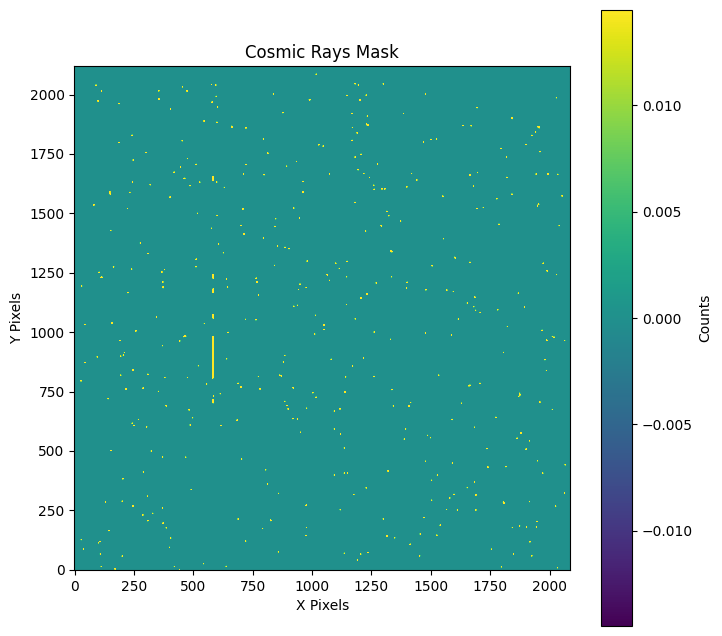

In [83]:
factor = 1
plt.figure("Cosmic rays mask", figsize=(8, 8))

plt.imshow(
    masksR[0],
    vmin=masksR0_stat['median_stat'] - factor * masksR0_stat['standard_deviation'],
    vmax=masksR0_stat['median_stat'] + factor * masksR0_stat['standard_deviation'],
    origin="lower"
)

plt.title("Cosmic Rays Mask") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")   

plt.colorbar(label="Counts")
plt.show()

### Bias correction

Similarly to what we did earlier with the Flats, we subtract the Super Bias obtained from each of the galaxy images. Since the Super Bias is a background noise for all the obtained images.

In [84]:
galaxyR_corr = [data - superBias for data in galaxyR_clean]
galaxyR_corr = np.array(galaxyR_corr)
superFlatsR = np.array(superFlatsR)

### Super Flats division

We normalize each of the galaxy images by dividing by the Super Flats of the corresponding filter, that is, Ha in this case.

In [85]:
galaxyR_norm = [
    data / superFlatsR 
    for data in galaxyR_corr
]

galaxyR_norm = np.nan_to_num(galaxyR_norm, nan=0)

C:\Users\Juan Jiménez Luque\AppData\Local\Temp\ipykernel_3600\2512552094.py:2: RuntimeWarning: divide by zero encountered in divide
  data / superFlatsR
C:\Users\Juan Jiménez Luque\AppData\Local\Temp\ipykernel_3600\2512552094.py:2: RuntimeWarning: invalid value encountered in divide
  data / superFlatsR


We define a variable in which we store the central region of the galaxy for each of the images.

In [86]:
edge = 300
galaxyR_norm_redu = [
    data[edge:-edge, edge:-edge]
    for data in galaxyR_norm
]

In [87]:
galaxyR_norm_redu_stat = imstats(galaxyR_norm_redu)

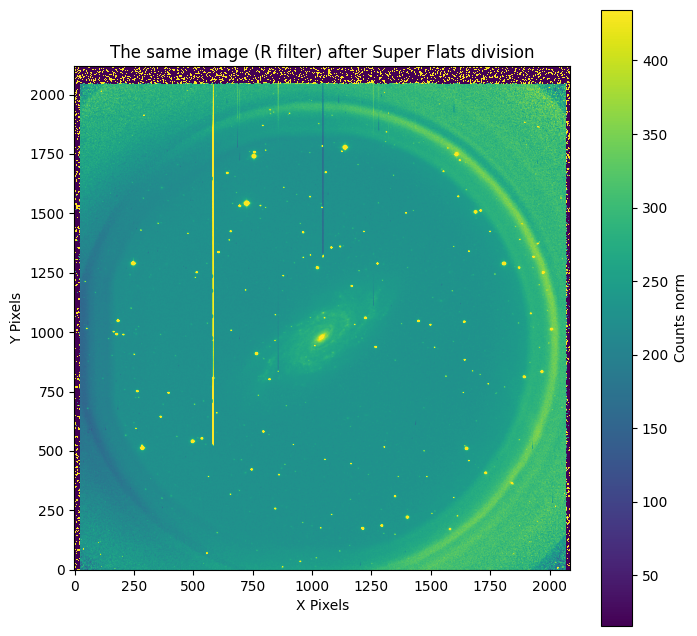

In [89]:
factor = 0.6
plt.figure("After Super Flats divisions R", figsize=(8, 8))

plt.imshow(
    galaxyR_norm[0],
    vmin=galaxyR_norm_redu_stat['median_stat'] - factor * galaxyR_norm_redu_stat['standard_deviation'],
    vmax=galaxyR_norm_redu_stat['median_stat'] + factor * galaxyR_norm_redu_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"The same image (R filter) after Super Flats division") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

### Background light

In this step, we are going to remove the background light, which is noise throughout the image. The main source of this noise is the light from the moon, that is, sunlight reflected off the moon. For this, we work with [Photutils](https://photutils.readthedocs.io/en/stable/user_guide/background.html), specifically with Masking Sources

In [90]:
galaxyR_noLight = []

In [91]:
sigma_clip_lac = SigmaClip(sigma=3.0, maxiters=10)

threshold = [
    detect_threshold(data, nsigma=2.0, sigma_clip=sigma_clip_lac)
    for data in galaxyR_norm_redu
]

In [92]:
segment_img = [
    detect_sources(data1, data2, npixels=10)
    for data1, data2 in zip(galaxyR_norm_redu, threshold)
]

In [93]:
footprint_lac = circular_footprint(radius=10)
mask_list = [
    data.make_source_mask(footprint=footprint_lac)
    for data in segment_img
]

In [94]:
stats_list = [
    sigma_clipped_stats(data1, sigma=3.0, mask=data2)
    for data1, data2 in zip(galaxyR_norm_redu, mask_list)
]

We subtract the obtained median from all the pixels of the image we had obtained, each median with its corresponding image. Observe that we are subtracting data2[1], where data2 is an element of stats_list, which contains the obtained statistics. By checking the function's documentation, we see that at position [1], it returns the median, which is what we are interested in.

In [95]:
for data1, data2 in zip(galaxyR_norm, stats_list):
    galaxyR_noLight.append(data1 - data2[1])

In [61]:
# The galaxy data is saved after the background light is removed.
for i, data in enumerate(galaxyR_concat_corr):
    hduImg = fits.PrimaryHDU(data.astype(np.float32))
    hduImg.writeto(f"NGC6118_repo/cigR_skycorr_{i}.fits", overwrite=True)

### Bad pixel correction

In the same way as we did for the Hα images, we now correct the defective pixels in the image. Clearly anomalous vertical lines are visible, and these lines are caused by collisions on the CCD. To do this, we work with a list that indicates the position of the erroneous pixels.

We use np.loadtxt( ) to open the file containing the defective pixels. We directly save the values into four different variables (arrays), using unpack=True and dtype=int. The coordinates are defined in this way, subtracting one because the program used to detect the lines (ds9) and the data array in Python differ by one pixel. This could be taken into account by adjusting the indices in the calculation (in the following lines of code), but we have chosen to leave it as is to make it explicitly clear as commented.

In [96]:
x_1, x_2, y_1, y_2 = np.loadtxt('badpix.lis', unpack=True, dtype=int)

x_1 = x_1 - 1
x_2 = x_2 - 1
y_1 = y_1 - 1
y_2 = y_2 - 1
    
for j, data in enumerate(galaxyR_noLight):
    for x1, x2, y1, y2 in zip(x_1, x_2, y_1, y_2):
        x_neighbors = [x1 - 1, x2 + 1]
        
        for k in range(y1, y2 + 1):
            fp = data[k, x_neighbors]

            # Parameters of np.interp(): x are the positions where I want to perform the interpolation; xp are the reference data positions for interpolation; 
            # fp is the value at those positions.
            
            galaxyR_noLight[j][k, x1:(x2+1)] = np.interp(
                x=np.arange(x1, x2 + 1),
                xp=x_neighbors, fp=fp
            ) 

In [101]:
# The galaxy data is saved after the defective pixels are removed.
for i, data in enumerate(galaxyR_concat_corr):
    hduImg = fits.PrimaryHDU(data.astype(np.float32))
    hduImg.writeto(f"NGC6118_repo/cigR_pixcorr_{i}.fits", overwrite=True)

### Exptime division

We divide the image by the exposure time, thus normalizing the data, eliminating the effect of the capture time, and allowing consistent comparisons between different observations, making the results more universal and easily reusable.

In [97]:
galaxyR_exp = [
    data1 / data2
    for data1, data2 in zip(galaxyR_noLight, exptimeR)
]
galaxyR_exp = np.array(galaxyR_exp)

In [99]:
galaxyR_exp_stats = imstats(galaxyR_exp[0][300:-300, 300:-300])

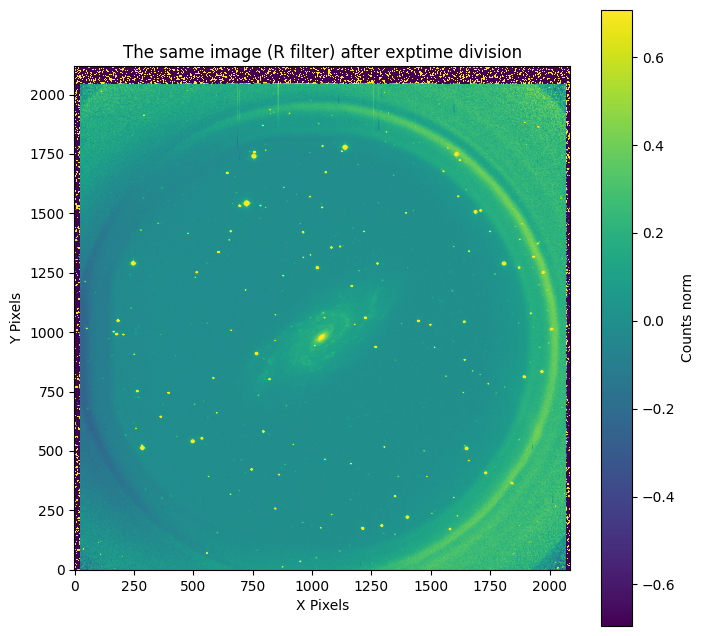

In [100]:
factor = 0.6
plt.figure("Exptime division R", figsize=(8, 8))

plt.imshow(
    galaxyR_exp[0],
    vmin=galaxyR_exp_stats['median_stat'] - factor * galaxyR_exp_stats['standard_deviation'],
    vmax=galaxyR_exp_stats['median_stat'] + factor * galaxyR_exp_stats['standard_deviation'],
    origin="lower"
)

plt.title(r"The same image (R filter) after exptime division") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

### Super Galaxy R

In a similar way to how we handled the Bias and Super Bias, and the Flats and Super Flats, we obtain the Super Galaxy R from all the already corrected galaxy R images. To do this, we stack all the galaxy R images and take the median of each pixel.

In [101]:
superGalaxyR = np.nanmedian(galaxyR_exp, axis=0)

superGalaxyR = np.nan_to_num(superGalaxyR, nan=0)

In [102]:
# The obtained Super Galaxy image is saved.
hduImg = fits.PrimaryHDU(superGalaxyR.astype(np.float32))
hduImg.writeto("NGC6118_repo/cigsuperR.fits", overwrite=True)

### Galaxy R's statistics

Now, using the function created, imstats( ), we calculate the statistics of the Super Galaxy R image, so that we can use it in the image visualization. In this case, we will obtain the statistics from the central area of the image, as this is where the galaxy, the object we want to study, is located. This way, we also avoid the statistics from the edges, which are influenced by the edge effects of the filter.

In [103]:
edge1 = 350
superGalaxyR_redu = superGalaxyR[edge1:-edge1, edge1:-edge1]

superGalaxyR_redu_stat = imstats(superGalaxyR_redu)

In [104]:
superGalaxyR_redu_sinan = np.nan_to_num(superGalaxyR_redu, nan=0)

superGalaxyR_redu_sinan_stat = imstats(superGalaxyR_redu_sinan)

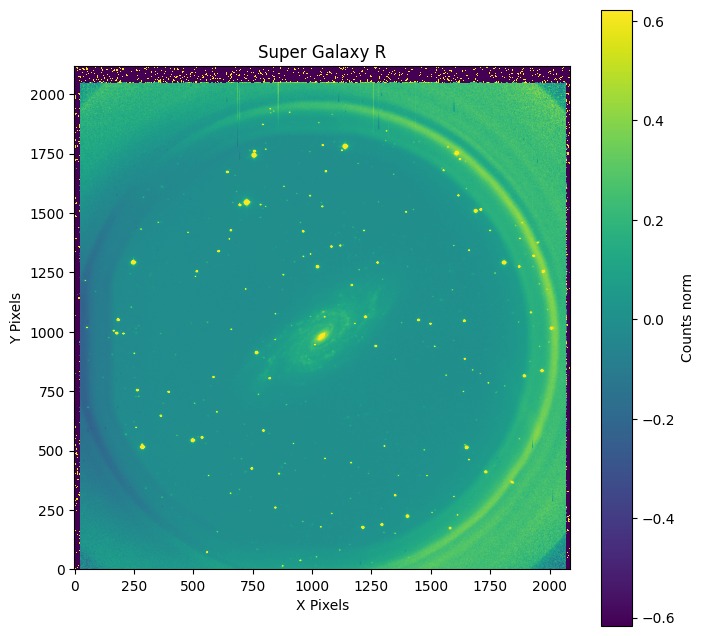

In [113]:
factor = 0.6
plt.figure("Super Galaxy Ha", figsize=(8, 8))

plt.imshow(
    superGalaxyR,
    vmin=superGalaxyR_redu_sinan_stat['median_stat'] - factor * superGalaxyR_redu_sinan_stat['standard_deviation'],
    vmax=superGalaxyR_redu_sinan_stat['median_stat'] + factor * superGalaxyR_redu_sinan_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"Super Galaxy R") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

### DAOStarFinder - Photometry

For the R filter, we do not perform the detection of extragalactic stars again, as other stars would be detected, and we would not be able to carry out the study we need. Therefore, we work with the positions obtained previously, that is, the positions of the stars that were obtained by performing photometry on the Ha galaxy image.

In [105]:
apertures = CircularAperture(positions, r=10)
out_phot = aperture_photometry(superGalaxyR_redu_sinan, apertures)
out_phot

id,xcenter,ycenter,aperture_sum
int64,float64,float64,float64
1,1382.9726747114842,58.82467609265136,374.7384905355242
2,399.0625641990356,73.07038018833686,208.67123314073262
3,1302.2871124066728,161.85274132794018,1234.195675389261
4,150.90969215233605,191.68006538356687,1723.7364562939888
5,189.8050181960746,204.02158730587064,314.317717332286
6,448.06741809829845,232.67189616205843,241.2337307680715
7,16.881290231165607,295.1181616345547,141.5062886048254
8,237.76744804925133,457.98950272846366,112.71865595512702
9,1294.452291113696,534.7168451938333,101.97713472150166


In [107]:
fluxR = np.array(out_phot['aperture_sum'])

### Galaxy (R) visualization

Next, we display the image of the galaxy (R) and mark the positions of the stars we have located with a red circle.

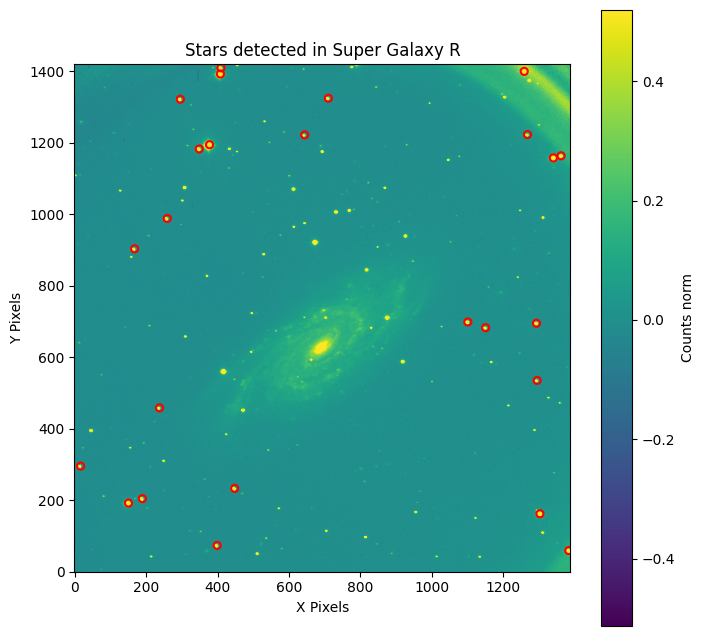

In [135]:
factor = 0.5
plt.figure("Super Galaxy R - Stars", figsize=(8, 8))

plt.imshow(
    superGalaxyR_redu,
    vmin=superGalaxyR_redu_sinan_stat['median_stat'] -
        factor * superGalaxyR_redu_sinan_stat['standard_deviation'],
    vmax=superGalaxyR_redu_sinan_stat['median_stat'] +
        factor * superGalaxyR_redu_sinan_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"Stars detected in Super Galaxy R") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

apertures.plot(color='red', lw=1.5)

plt.colorbar(label="Counts norm")
plt.show()

# Super Image

Below are the final steps to obtain the final image. The ultimate goal, as previously mentioned, is to obtain a 3D representation of the HII regions of the galaxy. To achieve this, the following steps are carried out: performing a linear regression between the Hα flux and the R-band flux to obtain the factor (the slope of the linear fit) that allows us to extract the continuum, leaving only the HII regions. Once the continuum has been removed, the galaxy must be projected to simulate a face-on view instead of the edge-on perspective we have been using so far. Finally, using DAOStarFinder once again, we will locate the HII regions in the projected galaxy. Lastly, we will represent the HII regions in a 3D image.

## Linear Regression

In this section, we will perform a linear fit. We plot a graph of the flux obtained in the Ha filter against the flux obtained in the R filter for the detected stars. Remember that the stars were detected exclusively with the Ha filter, while the flux has been measured for both filters. The goal of this section is to find the slope of the linear fit of the discussed graph.

In [123]:
coefs = np.polyfit(fluxR, fluxHa, 1)
m, b = coefs
print(m)

0.027253979860379026


Next, we plot the points on the graph and the line obtained from the linear fit.

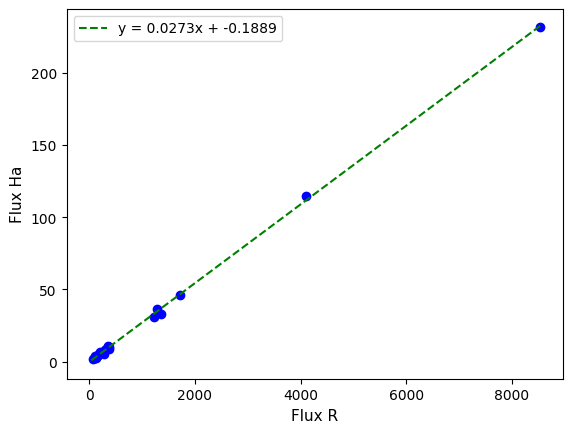

In [128]:
x = np.linspace(np.max(fluxR), 0)
y = m * x + b

plt.scatter(fluxR, fluxHa, color='blue')
plt.plot(x, y, '--', label=f'y = {m:.4f}x + {b:.4f}', color='green')

plt.xlabel("Flux R", fontsize = 11)
plt.ylabel("Flux Ha", fontsize = 11)

plt.legend()
plt.show()

## Continuum subtraction

Once we have obtained the slope of the linear fit, we can scale the flux of the galaxy measured with the R filter (Super Galaxy R) using this slope and subtract it from the flux of the galaxy measured with the Ha filter (Super Galaxy Ha). As mentioned, the R filter is wider than the Ha filter, in the sense that it covers a broader spectrum of wavelengths. The Ha filter allows us to locate the HII regions of the galaxy, but in order to do so, we must subtract the part of the continuum that is not of interest to us, and that is what we do in this section.

In [136]:
superGalaxy = superGalaxyHa - m * superGalaxyR

We work as we have done so far with the central part of the galaxy to perform the statistics, since, as we know, the galaxy is located at the center of the image.

In [138]:
edge = 300
superGalaxy_redu = superGalaxy[edge:-edge, edge:-edge]

superGalaxy_redu_stat = imstats(superGalaxyHa_sub_redu)

We visualize the obtained image.

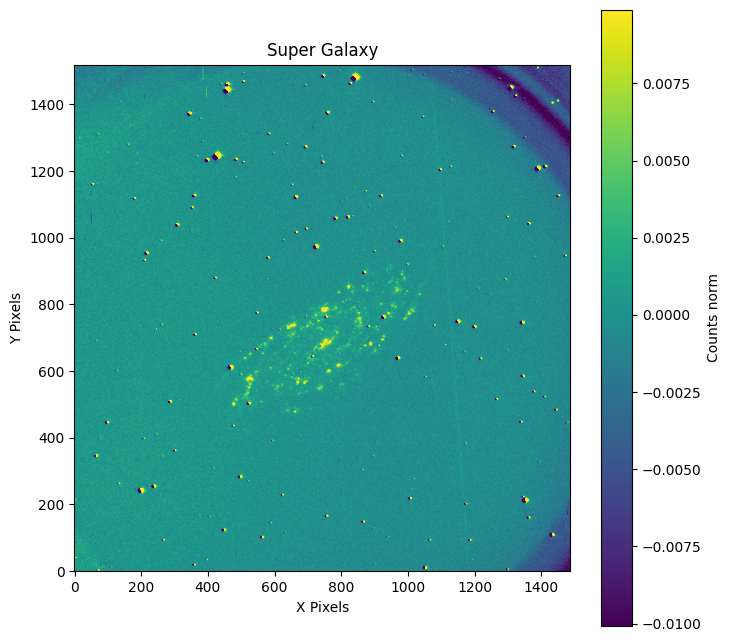

In [140]:
factor = 0.3
plt.figure("Super Galaxy Final", figsize=(8, 8))

plt.imshow(
    superGalaxy_redu,
    vmin=superGalaxy_redu_stat['median_stat'] - factor * superGalaxy_redu_stat['standard_deviation'],
    vmax=superGalaxy_redu_stat['median_stat'] + factor * superGalaxy_redu_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"Super Galaxy") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

## Galaxy projection

In this section, we will project the galaxy. As we have seen so far, the galaxy is not presented in a frontal view but rather tilted to some degree. To do this, we will rotate the galaxy to align the major axis with the horizontal axis. Then, to simulate the galaxy being viewed from the front, we will scale the minor axis until it matches the dimension of the major axis.

In [142]:
angle = 35
superGalaxy_gir = rotate(superGalaxy_redu, angle, reshape=False)

Here we visualize the rotation of the galaxy image and observe that the major axis aligns with the horizontal axis.

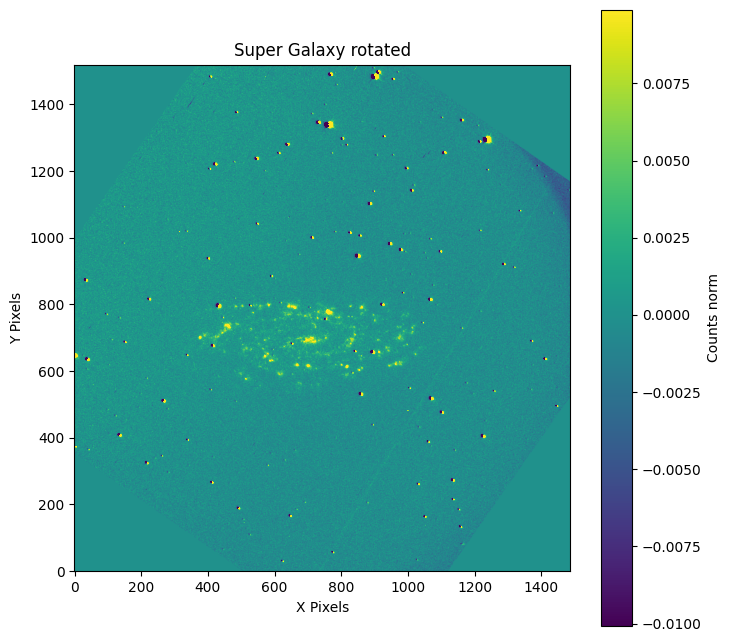

In [144]:
plt.figure("Galaxy Rotate", figsize=(8, 8))
plt.imshow(
    superGalaxy_gir,
    vmin=superGalaxy_redu_stat['median_stat'] - factor * superGalaxy_redu_stat['standard_deviation'],
    vmax=superGalaxy_redu_stat['median_stat'] + factor * superGalaxy_redu_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"Super Galaxy rotated") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

In [145]:
superGalaxy_gir_zoom = zoom(superGalaxy_gir, (3,1))

Here we visualize the expansion of the minor axis and observe how we have managed to simulate the galaxy being viewed from the front.

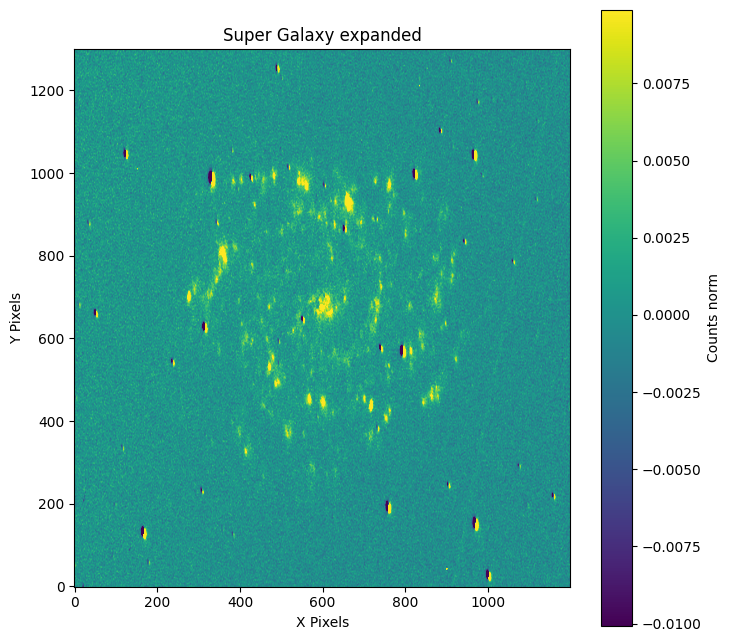

In [149]:
factor = 0.3
plt.figure("Galaxy Rotate Zoom", figsize=(8, 8))
plt.imshow(
    superGalaxy_gir_zoom[1400:2700,100:1300],
    vmin=superGalaxy_redu_stat['median_stat'] - factor * superGalaxy_redu_stat['standard_deviation'],
    vmax=superGalaxy_redu_stat['median_stat'] + factor * superGalaxy_redu_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"Super Galaxy expanded") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.colorbar(label="Counts norm")
plt.show()

## Localization of the HII regions

This step brings us closer to the final goal: to locate the HII regions. As previously mentioned, this will allow us to study the morphology of the galaxy and identify the areas where star formation is taking place. To do this, we use the DAOStarFinder function again, which we previously used for the detection of extragalactic stars.

In [541]:
superGalaxyHII = superGalaxy_gir_zoom[1400:2700, 100:1300]
superGalaxyHII_stat = imstats(superGalaxyHII)
print(superGalaxyHII.shape)

(1300, 1200)


In [608]:
factor = 1.3
daofind = DAOStarFinder(fwhm=8, threshold=factor * superGalaxyHII_stat['standard_deviation']) 

In [617]:
edge = 360
maskHII=np.ones(superGalaxyHII.shape, dtype=bool)
maskHII[edge:-edge,edge:-edge] = False

In [618]:
sourcesHII = daofind(superGalaxyHII - superGalaxyHII_stat['median_stat'], mask=maskHII) 

In [619]:
for col in sources.colnames:  
    if col not in ('id', 'npix'):
        sourcesHII[col].info.format = '%.2f'

sourcesHII.pprint(max_width=76) 

 id xcentroid ycentroid sharpness ... peak  flux  mag  daofind_mag
--- --------- --------- --------- ... ---- ----- ----- -----------
  1    515.24    366.73      0.36 ... 0.01  0.67  0.43       -0.16
  2    399.65    368.77      0.21 ... 0.00  0.33  1.20       -0.31
  3    617.43    404.19      0.51 ... 0.00  0.06  3.11       -0.09
  4    589.32    410.55      0.67 ... 0.01  0.14  2.10       -0.49
  5    624.63    421.66      0.44 ... 0.01  0.31  1.28       -0.36
  6    478.17    423.62      0.45 ... 0.00  0.14  2.11       -0.17
  7    683.08    453.91      0.62 ... 0.01  0.31  1.27       -0.59
  8    432.78    489.02      0.42 ... 0.00  0.15  2.07       -0.20
  9    492.87    494.18      0.54 ... 0.01  0.88  0.14       -0.61
 10    659.94    498.15      0.60 ... 0.00  0.03  3.79       -0.08
 11    508.05    506.02      0.55 ... 0.01  0.30  1.31       -0.07
 12    438.84    517.10      0.23 ... 0.00  0.06  3.12       -0.07
 13    767.81    519.89      0.61 ... 0.01  0.16  1.98       -

In [620]:
positionsHII = np.transpose((sourcesHII['xcentroid'], sourcesHII['ycentroid']))

In [621]:
peak = np.array(sourcesHII['peak'])
flux = np.array(sourcesHII['flux'])

aperturesHII = CircularAperture(positionsHII, r=10)

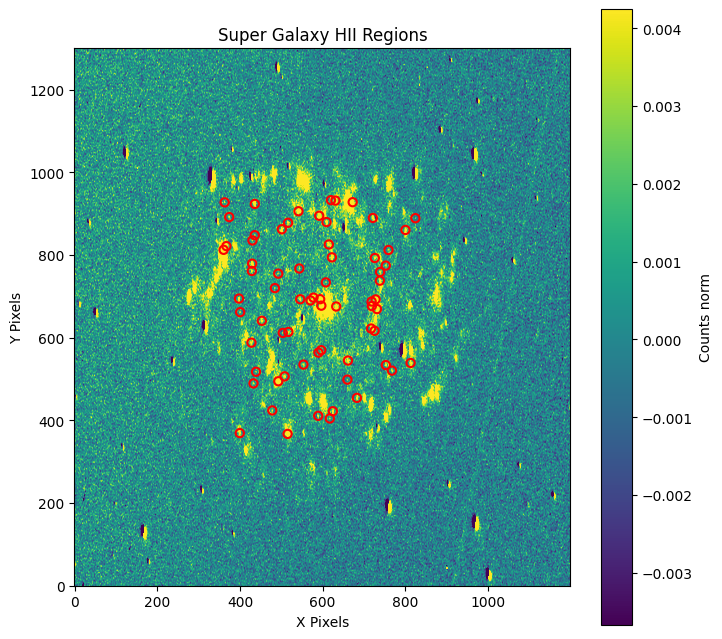

In [632]:
factor = 0.5
plt.figure("Super Galaxy HII Regions", figsize=(8, 8))

plt.imshow(
    superGalaxyHII,
    vmin=superGalaxyHII_stat['median_stat'] -
        factor * superGalaxyHII_stat['standard_deviation'],
    vmax=superGalaxyHII_stat['median_stat'] + 
        factor * superGalaxyHII_stat['standard_deviation'],
    origin="lower"
)

plt.title(r"Super Galaxy HII Regions") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

aperturesHII.plot(color='red', lw=1.5)

plt.colorbar(label="Counts norm")
plt.show()

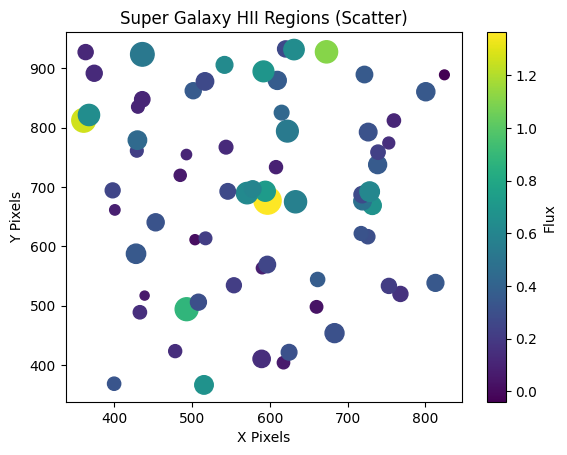

In [635]:
positionsHII = np.array(positionsHII)

x = positionsHII[:, 0]
y = positionsHII[:, 1]
z = np.zeros(len(x))

peak_s = 2*10**4 * peak

plt.scatter(x, y, s=peak_s, c=flux)
plt.colorbar(label='Flux')

plt.title(r"Super Galaxy HII Regions (Scatter)") 
plt.xlabel("X Pixels")         
plt.ylabel("Y Pixels")

plt.show()

## Visualization of the HII regions in 3D

Once we have identified the HII regions of the galaxy, we can create a 3D representation and with that, observe the morphology of the galaxy. Note that the parameter s specifies the size of each point in the plot and is made proportional to the peak. On the other hand, c specifies the color of each point, which is determined by the flux values of each HII region.

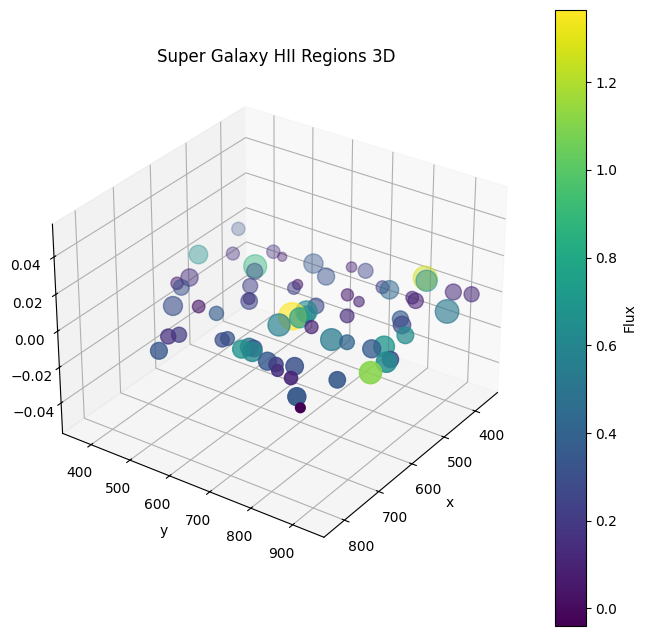

In [638]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(x, y, z, s=peak_s, c=flux)
ax.view_init(elev=30, azim=35)
plt.colorbar(scatter, label='Flux')

ax.set_title(r"Super Galaxy HII Regions 3D")  
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

plt.show()

# Conclusions

The code we developed has allowed us to delve into the fundamentals of data reduction in astrophysics. We have worked with essential libraries in this field, such as Astropy, Lacosmic, and Photutils, as well as other tools necessary for data processing.

We have worked with the most common file types in astrophysics, processing data with various functionalities and Python tools. Throughout the process, we have used calibration images, such as Bias and Flats, the latter for the Ha and R filters. After processing this data, we obtained a single image to work with: Super Bias, Super Flats Ha, and Super Flats R.

These images have enabled us to work with the galaxy images and carry out the cleaning process. First, cosmic rays were removed from the images using Lacosmic, Bias corrections were applied, and the Flats were divided to reduce background noise and adjust pixel sensitivity. Additionally, we normalized the images based on exposure time and removed defective pixels from the CCD before obtaining the final images for each filter: Super Galaxy Ha and Super Galaxy R.

Once these images were obtained, we performed photometry on the Ha image to determine the position and flux of extragalactic stars. Subsequently, with the determined positions, the flux of these stars was obtained in the R filter image. We performed a linear regression between the flux detected in the Ha image and that obtained in the R image, aiming to eliminate the continuous part of the image spectrum.

Finally, we projected the image to simulate a frontal view of the galaxy. With this new representation, we performed photometry again to identify the HII regions within the galaxy. Finally, we represented these HII regions in both 2D and 3D.

The ultimate goal of this work was to locate and represent the HII regions in the galaxy, which allows for studying its morphology as well as star-forming regions. HII regions are clouds of ionized gas, primarily hydrogen, illuminated by young and massive stars, meaning stars that have just been born.

The 3D image of the HII regions we obtained did not match our expectations. We had anticipated an image that would better highlight the structure and shape of the galaxy, providing much greater detail of the spiral arms.